# Kalman Filtering for Camera Angles 2 and 3
### + Bar Graphs Comparing Filtering
#### 4/17/23

In [1]:
import csv
from pykalman import KalmanFilter
import numpy as np
import matplotlib.pyplot as plt
import time
import numpy as np
import math

In [2]:
# functions to open and read csv files w/ annotations
def openCSV_getData_computer(file_csv):
    file = open(file_csv)
    type(file)
    csvreader = csv.reader(file)
    rows = []
    for row in csvreader:
        rows.append(row)
    rows = rows[3:]
    data = []
    for i in range(len(rows)):
        temp = rows[i][:]
        temp.pop(-1)
        temp.pop(15)
        temp.pop(12)
        temp.pop(9)
        temp.pop(6)
        temp.pop(3)
        temp.pop(0)
        data.append(temp)
    return data

def distanceBetweenPoints(x1, y1, x2, y2):
    xDiff = abs(x2 - x1)
    yDiff = abs(y2 - y1)
    xDiff = xDiff**2
    yDiff = yDiff**2
    distance = xDiff + yDiff
    distance = math.pow(distance, 1/2)
    return distance

def bubbleSort(arr):
    n = len(arr)
    swapped = False
    for i in range(n-1):
        for j in range(0, n-i-1):
            if arr[j][0] > arr[j + 1][0]:
                swapped = True
                arr[j], arr[j + 1] = arr[j + 1], arr[j]
        if not swapped:
            return
        
def bubbleSort_reverse(arr):
    n = len(arr)
    swapped = False
    for i in range(n-1):
        for j in range(0, n-i-1):
            if arr[j][0] < arr[j + 1][0]:
                swapped = True
                arr[j], arr[j + 1] = arr[j + 1], arr[j]
        if not swapped:
            return
        
# put  each x and y coordinate into own np.array
def coordinates_array(data):
    x = []
    y = []
    for d in range(6):
        partX = []
        partY = []
        for i in range(len(data)):
            xCoor = data[i][d*2]
            yCoor = data[i][d*2+1]
            partX.append(xCoor)
            partY.append(yCoor)
        x.append(partX)
        y.append(partY)
    x = np.array(x)
    y = np.array(y)
    return x, y

def putIntoASARRAY(x, y, part):
    data = []
    for i in range(len(x[part])):
        temp = [float(x[part][i]), float(y[part][i])]
        data.append(temp)
    return np.asarray(data)

# Getting the cross validation points
def removeScorer_otherInfo(csv_file):
    # remove indeces 0-3
    data = csv_file[3:]
    imgNames = []
    for i in range(len(data)):
        imgNames.append(data[i][2])
        temp = data[i]
        temp = temp[3:]
        data[i] = temp
    return [data, imgNames]
#b1_c1_j = removeScorer_otherInfo(rows)

def openCSV_getData(file_csv):
    file = open(file_csv)
    type(file)
    csvreader = csv.reader(file)
    rows = []
    for row in csvreader:
        rows.append(row)
    temp = removeScorer_otherInfo(rows)
    data = temp[0]
    imgNames = temp[1]
    return data, imgNames

def correctImages(img):
    new = []
    numbs = []
    for i in range(len(img)):
        temp = 'frame' 
        t = img[i][5:9] 
        print(t)
        if t[0] == "0":
            t = t[1:]
        temp = temp + t + '.jpg'
        numbs.append(int(t))
        new.append(temp)
    return new, numbs


In [3]:
# length = # of images annotated , 6 body part labels in each
folder = '/Users/betinakreiman/Desktop/Life/research/comparing_csv_annotations/computer_labels_3cam/'
cross_b1_j_computer = openCSV_getData_computer(folder + 'Block0001_Cam1DLC_resnet50_Demo_220728Jul29shuffle1_100000.csv')
cross_b2_j_computer = openCSV_getData_computer(folder + 'Block0001_Cam2DLC_resnet50_Demo_220728Jul29shuffle1_100000.csv')
cross_b3_j_computer = openCSV_getData_computer(folder + 'Block0001_Cam3DLC_resnet50_Demo_220728Jul29shuffle1_100000.csv')

cross_b1_k_computer = openCSV_getData_computer(folder + 'Block0001_Cam1DLC_resnet50_3d_analysisJul29shuffle1_1030000.csv')
cross_b2_k_computer = openCSV_getData_computer(folder + 'Block0001_Cam2DLC_resnet50_3d_analysisJul29shuffle1_1030000.csv')
cross_b3_k_computer = openCSV_getData_computer(folder + 'Block0001_Cam3DLC_resnet50_3d_analysisJul29shuffle1_1030000.csv')

#b1_, img1_ = openCSV_getData(folder + '')
#b2_, img2_ = openCSV_getData(folder + '')
#b3_, img3_ = openCSV_getData(folder + '')

In [4]:
cross_kreiman_1 = openCSV_getData("/Users/betinakreiman/Desktop/Life/research/Figures/Figure5/cam1NewAnnotations-Kreiman-2022-10-05/labeled-data/Block0001_Cam1/CollectedData_Kreiman.csv")
cross_b1_k, cross_img1_k = cross_kreiman_1[0], cross_kreiman_1[1]
cross_kreiman_2 = openCSV_getData("/Users/betinakreiman/Desktop/Life/research/Figures/Figure5/cam1NewAnnotations-Kreiman-2022-10-05/labeled-data/Block0001_Cam2/CollectedData_Kreiman.csv")
cross_b2_k, cross_img2_k = cross_kreiman_2[0], cross_kreiman_2[1]
cross_kreiman_3 = openCSV_getData("/Users/betinakreiman/Desktop/Life/research/Figures/Figure5/cam1NewAnnotations-Kreiman-2022-10-05/labeled-data/Block0001_Cam3/CollectedData_Kreiman.csv")
cross_b3_k, cross_img3_k = cross_kreiman_3[0], cross_kreiman_3[1]


cross_jaeson_1 = openCSV_getData("/Users/betinakreiman/Desktop/Life/research/Figures/Figure5/labeled-data_Jaeson/Block0001_Cam1/CollectedData_Jaeson.csv")
cross_b1_j, cross_img1_j = cross_jaeson_1[0], cross_jaeson_1[1]
cross_jaeson_2 = openCSV_getData("/Users/betinakreiman/Desktop/Life/research/Figures/Figure5/labeled-data_Jaeson/Block0001_Cam2/CollectedData_Jaeson.csv")
cross_b2_j, cross_img2_j = cross_jaeson_2[0], cross_jaeson_2[1]
cross_jaeson_3 = openCSV_getData("/Users/betinakreiman/Desktop/Life/research/Figures/Figure5/labeled-data_Jaeson/Block0001_Cam3/CollectedData_Jaeson.csv")
cross_b3_j, cross_img3_j = cross_jaeson_3[0], cross_jaeson_3[1]


In [5]:
def getIndecesCrossValidation(imgs):
    index = []
    for i in range(len(imgs)):
        temp = imgs[i][:-4]
        temp = temp[5:]
        index.append(temp)
    return index
indeces_1 = getIndecesCrossValidation(cross_img1_k)
indeces_2 = getIndecesCrossValidation(cross_img2_k)
indeces_3 = getIndecesCrossValidation(cross_img3_k)

In [6]:
import numpy as np
def crossValidate(human, computer, indexs):
    differences = []
    avg = 0
    count = 0
    for i in range(len(human)):
        compIndex = int(indexs[i])
        #print(compIndex)
        for d in range(6):
            h_x, h_y = 0, 0
            
            c_x, c_y = float(computer[compIndex][d*2]), float(computer[compIndex][d*2+1])
            distance = 0
            if human[i][d*2] != '' and human[i][d*2+1] != '':
                h_x, h_y = float(human[i][d*2]), float(human[i][d*2+1])
                distance = distanceBetweenPoints(h_x, h_y, c_x, c_y)
                differences.append(distance)
            
            
    print("avg is ", np.mean(differences))
    print("std is ", np.std(differences))
    print()
    return differences, avg

In [7]:
c0_diff_k_1, c0_average_k_1 = crossValidate(cross_b1_k, cross_b1_k_computer, indeces_1)

c0_diff_k_2, c0_average_k_2 = crossValidate(cross_b2_k, cross_b2_k_computer, indeces_2)

c0_diff_k_3, c0_average_k_3 = crossValidate(cross_b3_k, cross_b3_k_computer, indeces_3)

avg is  15.605184670606464
std is  37.536086677795005

avg is  10.994523785418014
std is  21.13158648839041

avg is  8.695364205354922
std is  4.116366298897726



In [8]:
c0_diff_j_1, average_j_1 = crossValidate(cross_b1_j, cross_b1_j_computer, indeces_1)

c0_diff_j_2, average_j_2 = crossValidate(cross_b2_j, cross_b2_j_computer, indeces_2)

c0_diff_j_3, average_j_3 = crossValidate(cross_b3_j, cross_b3_j_computer, indeces_3)

avg is  10.526031189655642
std is  7.700235900224916

avg is  25.24974728875052
std is  25.073592934985953

avg is  21.590842802948966
std is  29.18646060267376



In [9]:
# human - human
def distance_human(kreiman, jaeson):
    dists = []
    for i in range(len(kreiman)):
        for bodyPart in range(6):
            if kreiman[i][bodyPart*2] != '' and kreiman[i][bodyPart*2+1] != '' and jaeson[i][bodyPart*2] != '' and jaeson[i][bodyPart*2+1] != '':
                k_x = float(kreiman[i][bodyPart*2])
                j_x = float(jaeson[i][bodyPart*2])
                k_y = float(kreiman[i][bodyPart*2+1])
                j_y = float(jaeson[i][bodyPart*2+1])
                dist = distanceBetweenPoints(k_x, k_y, j_x, j_y)
                dists.append(dist)
    
    return dists
distances_cam1_human = distance_human(cross_b1_k, cross_b1_j)
distances_cam2_human = distance_human(cross_b2_k, cross_b2_j)
distances_cam3_human = distance_human(cross_b3_k, cross_b3_j)



In [10]:
print(np.mean(distances_cam1_human))
print(np.std(distances_cam1_human))
print(len(distances_cam1_human))
print()
print(np.mean(distances_cam2_human))
print(np.std(distances_cam2_human))
print(len(distances_cam2_human))
print()
print(np.mean(distances_cam3_human))
print(np.std(distances_cam3_human))
print(len(distances_cam3_human))
print()

11.283387713006709
9.395998002313862
118

11.889132534728537
8.77399495096201
97

15.872217014243207
10.05388543635606
79



### Kalman Filtering

In [11]:
x_b1_j, y_b1_j = coordinates_array(cross_b1_j)
x_b2_j, y_b2_j = coordinates_array(cross_b2_j)
x_b3_j, y_b3_j = coordinates_array(cross_b3_j)

x_b1_k, y_b1_k = coordinates_array(cross_b1_k)
x_b2_k, y_b2_k = coordinates_array(cross_b2_k)
x_b3_k, y_b3_k = coordinates_array(cross_b3_k)

In [12]:
# put  each x and y coordinate into own np.array
def coordinates_array_computer(data):
    x = []
    y = []
    for d in range(6):
        partX = []
        partY = []
        for i in range(len(data)):
            #index = numbers[i]
            xCoor = data[i][d*2]
            yCoor = data[i][d*2+1]
            partX.append(xCoor)
            partY.append(yCoor)
        x.append(partX)
        y.append(partY)
    x = np.array(x)
    y = np.array(y)
    return x, y

In [13]:
x_b1_j_computer, y_b1_j_computer = coordinates_array_computer(cross_b1_j_computer)
x_b2_j_computer, y_b2_j_computer = coordinates_array_computer(cross_b2_j_computer)
x_b3_j_computer, y_b3_j_computer = coordinates_array_computer(cross_b3_j_computer)

x_b1_k_computer, y_b1_k_computer = coordinates_array_computer(cross_b1_k_computer)
x_b2_k_computer, y_b2_k_computer = coordinates_array_computer(cross_b2_k_computer)
x_b3_k_computer, y_b3_k_computer = coordinates_array_computer(cross_b3_k_computer)

In [14]:
def smooth(measure, coef):
    measurements = measure[:]
    
    initial_state_mean = [measurements[0, 0],
                      0,
                      measurements[0, 1],
                      0]

    transition_matrix = [[1, 1, 0, 0],
                         [0, 1, 0, 0],
                         [0, 0, 1, 1],
                         [0, 0, 0, 1]]

    observation_matrix = [[1, 0, 0, 0],
                          [0, 0, 1, 0]]

    kf1 = KalmanFilter(transition_matrices = transition_matrix,
                      observation_matrices = observation_matrix,
                      initial_state_mean = initial_state_mean)

    kf1 = kf1.em(measurements, n_iter=5)
    (smoothed_state_means, smoothed_state_covariances) = kf1.smooth(measurements)
    
    kf2 = KalmanFilter(transition_matrices = transition_matrix,
                  observation_matrices = observation_matrix,
                  initial_state_mean = initial_state_mean,
                  observation_covariance = coef*kf1.observation_covariance,
                  em_vars=['transition_covariance', 'initial_state_covariance'])

    kf2 = kf2.em(measurements, n_iter=5)
    (smoothed_state_means, smoothed_state_covariances)  = kf2.smooth(measurements)
    
    return smoothed_state_means

In [15]:
def createArray(x, y):
    newArray = [putIntoASARRAY(x, y, 0),
               putIntoASARRAY(x, y, 1),
               putIntoASARRAY(x, y, 2),
               putIntoASARRAY(x, y, 3),
               putIntoASARRAY(x, y, 4),
               putIntoASARRAY(x, y, 5)]
    return newArray

In [16]:
arr_block1_jaeson = createArray(x_b1_j_computer, y_b1_j_computer)
arr_block1_kreiman = createArray(x_b1_k_computer, y_b1_k_computer)

arr_block2_jaeson = createArray(x_b2_j_computer, y_b2_j_computer)
arr_block2_kreiman = createArray(x_b2_k_computer, y_b2_k_computer)

arr_block3_jaeson = createArray(x_b3_j_computer, y_b3_j_computer)
arr_block3_kreiman = createArray(x_b3_k_computer, y_b3_k_computer)

In [17]:
def createBlock_fast(arr, coef):
    newBlock = [smooth(arr[0], coef),
                smooth(arr[1], coef),
                smooth(arr[2], coef),
                smooth(arr[3], coef),
                smooth(arr[4], coef),
                smooth(arr[5], coef)]
    return newBlock

In [18]:
def createBlock(x, y, coef):
    newBlock = [smooth(putIntoASARRAY(x, y, 0), coef),
                smooth(putIntoASARRAY(x, y, 1), coef),
                smooth(putIntoASARRAY(x, y, 2), coef),
                smooth(putIntoASARRAY(x, y, 3), coef),
                smooth(putIntoASARRAY(x, y, 4), coef),
                smooth(putIntoASARRAY(x, y, 5), coef)]
    return newBlock

In [19]:
def calculateAvg(kreiman, jaeson):
    distances = 0 
    for i in range(len(kreiman)):
        for j in range(len(kreiman[i])):
            k_x = float(kreiman[i][j][0])
            j_x = float(jaeson[i][j][0])
            k_y = float(kreiman[i][j][2])
            j_y = float(jaeson[i][j][2])
            distances += distanceBetweenPoints(k_x, k_y, j_x, j_y)
    distances = distances / (len(kreiman) * len(kreiman[0])) 
    return distances

In [20]:
def createGraphs(measured, smoothed, title, xLim, humanX, humanY, frameNumber):   
    plt.figure(2)
    times = range(measured.shape[0])
    plt.plot(times, measured[:, 0], 'bo', # x coor
             times, measured[:, 1], 'ro', # y coor
             times, smoothed[:, 0], 'b--', # x coor
             times, smoothed[:, 2], 'r--',) # y coor
    
    #plt.plot(4, 3, marker="o", markersize=20, markeredgecolor="red", markerfacecolor="green")
    plt.plot(frameNumber, humanX, marker="o", markersize=15, markeredgecolor="black", markerfacecolor="none")
    plt.plot(frameNumber, humanY, marker="o", markersize=15, markeredgecolor="black", markerfacecolor="none")
    plt.xlim(xLim)
    plt.xlabel('Frames', fontweight ='bold', fontsize = 13)
    plt.ylabel('Coordinates', fontweight ='bold', fontsize = 13)
    #plt.title(title, fontweight ='bold', fontsize = 14)
    plt.show()

In [21]:
def testCoef():
    avgs = {}
    coefficients = [0]
    for i in coefficients:
        block1_jaeson = createBlock(x_b1_j_computer, y_b1_j_computer, i)
        block1_kreiman = createBlock(x_b1_k_computer, y_b1_k_computer, i)

        block2_jaeson = createBlock(x_b2_j_computer, y_b2_j_computer, i)
        block2_kreiman = createBlock(x_b2_k_computer, y_b2_k_computer, i)

        block3_jaeson = createBlock(x_b3_j_computer, y_b3_j_computer, i)
        block3_kreiman = createBlock(x_b3_k_computer, y_b3_k_computer, i)
        
        avg1 = calculateAvg(block1_jaeson, block1_kreiman)
        avg2 = calculateAvg(block2_jaeson, block2_kreiman)
        avg3 = calculateAvg(block3_jaeson, block3_kreiman)
        
        avgs[i] = [avg1, avg2, avg3]
        
        print('Coefficient is ', i)
        
        for i in range(1): #20!
            
            createGraphs(arr_block1_jaeson[0], block1_jaeson[0], 'Jaeson Left Foot Block 1', frames[i], float(x_b1_j[0][i]), float(y_b1_j[0][i]))
            
            #createGraphs(arr_block1_kreiman[0], block1_kreiman[0], 'Betina Left Foot Block 1', frames[i], x_b1_k[i], y_b1_k[i])
            
            
            print()
            
            #createGraphs(arr_block1_jaeson[1], block1_jaeson[1], 'Jaeson Left Foot Block 1', frames[i])
            #createGraphs(arr_block1_kreiman[1], block1_kreiman[1], 'Betina Left Foot Block 1', [3600, 3700])
        
            #createGraphs(arr_block2_jaeson[1], block2_jaeson[1], 'Jaeson Left Knee Block 2', [1550, 1650])
            #createGraphs(arr_block2_kreiman[1], block2_kreiman[1], 'Betina Left Knee Block 2', [1550, 1650])

            #createGraphs(arr_block3_jaeson[2], block3_jaeson[2], 'Jaeson Left Thigh Block 3', [1300, 1400])
            #createGraphs(arr_block3_kreiman[2], block3_kreiman[2], 'Betina Left Thigh Block 3', [1300, 1400])
            print()
            print()
    return avgs
#averages = testCoef()

In [22]:
block1_jaeson_0 = createBlock(x_b1_j_computer, y_b1_j_computer, 0)
block1_kreiman_0 = createBlock(x_b1_k_computer, y_b1_k_computer, 0)

block2_jaeson_0 = createBlock(x_b2_j_computer, y_b2_j_computer, 0)
block2_kreiman_0 = createBlock(x_b2_k_computer, y_b2_k_computer, 0)

block3_jaeson_0 = createBlock(x_b3_j_computer, y_b3_j_computer, 0)
block3_kreiman_0 = createBlock(x_b3_k_computer, y_b3_k_computer, 0)

In [23]:
# block1_jaeson_1 = createBlock(x_b1_j_computer, y_b1_j_computer, 1)
# block1_kreiman_1 = createBlock(x_b1_k_computer, y_b1_k_computer, 1)

# block2_jaeson_1 = createBlock(x_b2_j_computer, y_b2_j_computer, 1)
# block2_kreiman_1 = createBlock(x_b2_k_computer, y_b2_k_computer, 1)

# block3_jaeson_1 = createBlock(x_b3_j_computer, y_b3_j_computer, 1)
# block3_kreiman_1 = createBlock(x_b3_k_computer, y_b3_k_computer, 1)

In [24]:
# block1_jaeson_3 = createBlock(x_b1_j_computer, y_b1_j_computer, 3)
# block1_kreiman_3 = createBlock(x_b1_k_computer, y_b1_k_computer, 3)

# block2_jaeson_3 = createBlock(x_b2_j_computer, y_b2_j_computer, 3)
# block2_kreiman_3 = createBlock(x_b2_k_computer, y_b2_k_computer, 3)

# block3_jaeson_3 = createBlock(x_b3_j_computer, y_b3_j_computer, 3)
# block3_kreiman_3 = createBlock(x_b3_k_computer, y_b3_k_computer, 3)

In [25]:
# block1_jaeson_5 = createBlock(x_b1_j_computer, y_b1_j_computer, 5)
# block1_kreiman_5 = createBlock(x_b1_k_computer, y_b1_k_computer, 5)

# block2_jaeson_5 = createBlock(x_b2_j_computer, y_b2_j_computer, 5)
# block2_kreiman_5 = createBlock(x_b2_k_computer, y_b2_k_computer, 5)

# block3_jaeson_5 = createBlock(x_b3_j_computer, y_b3_j_computer, 5)
# block3_kreiman_5 = createBlock(x_b3_k_computer, y_b3_k_computer, 5)

In [26]:
block1_jaeson_10 = createBlock(x_b1_j_computer, y_b1_j_computer, 10)
block1_kreiman_10 = createBlock(x_b1_k_computer, y_b1_k_computer, 10)

block2_jaeson_10 = createBlock(x_b2_j_computer, y_b2_j_computer, 10)
block2_kreiman_10 = createBlock(x_b2_k_computer, y_b2_k_computer, 10)

block3_jaeson_10 = createBlock(x_b3_j_computer, y_b3_j_computer, 10)
block3_kreiman_10 = createBlock(x_b3_k_computer, y_b3_k_computer, 10)

In [27]:
numbers = [1504, 1513, 1584, 17, 1806, 1867, 2424, 2807, 2897, 2903, 2927, 4376, 4763, 5068, 
           5199, 5409, 5684, 60, 627, 912]

In [28]:
frames = [[1450, 1550], [1450, 1550], [1550, 1650], [0, 100], [1750, 1850], [1800, 1900], [2400, 2500], 
          [2750, 2850], [2850, 2950], [2850, 2950], [2900, 3000], [4350, 4450], [4700, 4800], [5000, 5100], 
         [5150, 5250], [5350, 5450], [5650, 5750], [0, 100], [600, 700], [850, 950]]

#len(frames_origal)

In [29]:
def gait_cycles(indeces, s):
    gaits = []
    for i in range(len(indeces)):
        temp = [int(indeces[i]) - s, int(indeces[i]) + s]
        gaits.append(temp)
    return gaits
frames_1 = gait_cycles(indeces_1, 24)


In [30]:
blocks_0 = [block1_jaeson_0, block1_kreiman_0, block2_jaeson_0,
           block2_kreiman_0, block3_jaeson_0, block3_kreiman_0]
blocks_10 = [block1_jaeson_10, block1_kreiman_10, block2_jaeson_10,
           block2_kreiman_10, block3_jaeson_10, block3_kreiman_10]
arrs = [arr_block1_jaeson, arr_block1_kreiman, arr_block2_jaeson,
       arr_block2_kreiman, arr_block3_jaeson, arr_block3_kreiman]


In [31]:
def dist_between_models(model1, model2, indexs):
    differences = []
    for i in range(len(indexs)):
        compIndex = int(indexs[i])
        for d in range(6):
            c_x_1 = float(model1[d][compIndex][0])
            c_y_1 = float(model1[d][compIndex][2])
            
            c_x_2 = float(model2[d][compIndex][0])
            c_y_2 = float(model2[d][compIndex][2])

            distance = distanceBetweenPoints(c_x_1, c_y_1, c_x_2, c_y_2)
            differences.append(distance)
    return differences

In [32]:
def cross_validate_filter(human, model, indexs):
    differences = []
    for i in range(len(human)):
        compIndex = int(indexs[i])
        for d in range(6):
            h_x, h_y = 0, 0
            
            if human[i][d*2] != '' and human[i][d*2+1] != '':
                h_x, h_y = float(human[i][d*2]), float(human[i][d*2+1])
                
                c_x = float(model[d][compIndex][0])
                c_y = float(model[d][compIndex][2])
                
                #print(c_x, c_y)
                distance = distanceBetweenPoints(h_x, h_y, c_x, c_y)
                differences.append(distance)
    return differences

In [33]:
def print_stat(data):
    print(np.mean(data))
    print(np.std(data))
    print()

In [34]:
# Coefficient 0 (original differences)

c0_k_diff_1 = cross_validate_filter(cross_b1_k, block1_kreiman_0, indeces_1)
print_stat(c0_k_diff_1)
c0_k_diff_2 = cross_validate_filter(cross_b2_k, block2_kreiman_0, indeces_2)
print_stat(c0_k_diff_2)
c0_k_diff_3 = cross_validate_filter(cross_b3_k, block3_kreiman_0, indeces_3)
print_stat(c0_k_diff_3)

print()

c0_j_diff_1 = cross_validate_filter(cross_b1_j, block1_jaeson_0, indeces_1)
print_stat(c0_j_diff_1)
c0_j_diff_2 = cross_validate_filter(cross_b2_j, block2_jaeson_0, indeces_2)
print_stat(c0_j_diff_2)
c0_j_diff_3 = cross_validate_filter(cross_b3_j, block3_jaeson_0, indeces_3)
print_stat(c0_j_diff_3)

15.605184670606466
37.53608667779501

10.994523785418014
21.131586488390422

8.695364205354924
4.116366298897725


10.526031189655642
7.700235900224916

25.24974728875052
25.07359293498595

21.59084280294897
29.18646060267376



In [35]:
# Coefficient 1

c1_k_diff_1 = cross_validate_filter(cross_b1_k, block1_kreiman_1, indeces_1)
print_stat(c1_k_diff_1)
c1_k_diff_2 = cross_validate_filter(cross_b2_k, block2_kreiman_1, indeces_2)
print_stat(c1_k_diff_2)
c1_k_diff_3 = cross_validate_filter(cross_b3_k, block3_kreiman_1, indeces_3)
print_stat(c1_k_diff_3)

print()

c1_j_diff_1 = cross_validate_filter(cross_b1_j, block1_jaeson_1, indeces_1)
print_stat(c1_j_diff_1)
c1_j_diff_2 = cross_validate_filter(cross_b2_j, block2_jaeson_1, indeces_2)
print_stat(c1_j_diff_2)
c1_j_diff_3 = cross_validate_filter(cross_b3_j, block3_jaeson_1, indeces_3)
print_stat(c1_j_diff_3)

NameError: name 'block1_kreiman_1' is not defined

In [ ]:
# Coefficient 3

c3_k_diff_1 = cross_validate_filter(cross_b1_k, block1_kreiman_3, indeces_1)
print_stat(c3_k_diff_1)
c3_k_diff_2 = cross_validate_filter(cross_b2_k, block2_kreiman_3, indeces_2)
print_stat(c3_k_diff_2)
c3_k_diff_3 = cross_validate_filter(cross_b3_k, block3_kreiman_3, indeces_3)
print_stat(c3_k_diff_3)

print()

c3_j_diff_1 = cross_validate_filter(cross_b1_j, block1_jaeson_3, indeces_1)
print_stat(c3_j_diff_1)
c3_j_diff_2 = cross_validate_filter(cross_b2_j, block2_jaeson_3, indeces_2)
print_stat(c3_j_diff_2)
c3_j_diff_3 = cross_validate_filter(cross_b3_j, block3_jaeson_3, indeces_3)
print_stat(c3_j_diff_3)

In [ ]:
# Coefficient 5

c5_k_diff_1 = cross_validate_filter(cross_b1_k, block1_kreiman_5, indeces_1)
print_stat(c5_k_diff_1)
c5_k_diff_2 = cross_validate_filter(cross_b2_k, block2_kreiman_5, indeces_2)
print_stat(c5_k_diff_2)
c5_k_diff_3 = cross_validate_filter(cross_b3_k, block3_kreiman_5, indeces_3)
print_stat(c5_k_diff_3)

print()

c5_j_diff_1 = cross_validate_filter(cross_b1_j, block1_jaeson_5, indeces_1)
print_stat(c5_j_diff_1)
c5_j_diff_2 = cross_validate_filter(cross_b2_j, block2_jaeson_5, indeces_2)
print_stat(c5_j_diff_2)
c5_j_diff_3 = cross_validate_filter(cross_b3_j, block3_jaeson_5, indeces_3)
print_stat(c5_j_diff_3)

In [36]:
# Coefficient 10 

c10_k_diff_1 = cross_validate_filter(cross_b1_k, block1_kreiman_10, indeces_1)
print_stat(c10_k_diff_1)
c10_k_diff_2 = cross_validate_filter(cross_b2_k, block2_kreiman_10, indeces_2)
print_stat(c10_k_diff_2)
c10_k_diff_3 = cross_validate_filter(cross_b3_k, block3_kreiman_10, indeces_3)
print_stat(c10_k_diff_3)

print()

c10_j_diff_1 = cross_validate_filter(cross_b1_j, block1_jaeson_10, indeces_1)
print_stat(c10_j_diff_1)
c10_j_diff_2 = cross_validate_filter(cross_b2_j, block2_jaeson_10, indeces_2)
print_stat(c10_j_diff_2)
c10_j_diff_3 = cross_validate_filter(cross_b3_j, block3_jaeson_10, indeces_3)
print_stat(c10_j_diff_3)

18.3049067232077
27.312643278811894

22.557021368361717
27.363848172930357

26.71315152382562
29.633247566950253


11.846277537759121
8.184660795844799

30.982259645467742
27.594383909335956

34.01919183539938
33.74754412300111



In [37]:
def particular_part(human, model, indexs, part):
    differences = []
    for i in range(len(human)):
        compIndex = int(indexs[i])
        h_x, h_y = 0, 0
        
        if human[i][part*2] != '' and human[i][part*2+1] != '':
            h_x, h_y = float(human[i][part*2]), float(human[i][part*2+1])
                
            c_x = float(model[part][compIndex][0])
            c_y = float(model[part][compIndex][2])
                
            #print(c_x, c_y)
            distance = distanceBetweenPoints(h_x, h_y, c_x, c_y)
            differences.append(distance)
    return differences

In [38]:
# coefficient = [0, 1, 3, 5, 10]
# coeffs_kreiman_1 = [block1_kreiman_0, block1_kreiman_1, block1_kreiman_3, block1_kreiman_5, block1_kreiman_10]
# coeffs_jaeson_1 = [block1_jaeson_0, block1_jaeson_1, block1_jaeson_3, block1_jaeson_5, block1_jaeson_10]

coefficient = [0, 10]
coeffs_kreiman_1 = [block1_kreiman_0, block1_kreiman_10]
coeffs_jaeson_1 = [block1_jaeson_0, block1_jaeson_10]

In [39]:
# coeffs_kreiman_2 = [block2_kreiman_0, block2_kreiman_1, block2_kreiman_3, block2_kreiman_5, block2_kreiman_10]
# coeffs_jaeson_2 = [block2_jaeson_0, block2_jaeson_1, block2_jaeson_3, block2_jaeson_5, block2_jaeson_10]

# coeffs_kreiman_3 = [block3_kreiman_0, block3_kreiman_1, block3_kreiman_3, block3_kreiman_5, block3_kreiman_10]
# coeffs_jaeson_3 = [block3_jaeson_0, block3_jaeson_1, block3_jaeson_3, block3_jaeson_5, block3_jaeson_10]

coeffs_kreiman_2 = [block2_kreiman_0, block2_kreiman_10]
coeffs_jaeson_2 = [block2_jaeson_0, block2_jaeson_10]

coeffs_kreiman_3 = [block3_kreiman_0, block3_kreiman_10]
coeffs_jaeson_3 = [block3_jaeson_0, block3_jaeson_10]

In [40]:
def compare_all_coef(coeff_0, coeffs, part):
    for i in range(len(coeffs)):
        dists = particular_part(coeff_0, coeffs[i], indeces_1, part)
        #print(len(dists))
        print("Coefficient", coefficient[i], ",  average:", np.mean(dists), ",  std:", np.std(dists))
        print()

In [41]:
compare_all_coef(cross_b2_k, coeffs_kreiman_2, 5)

Coefficient 0 ,  average: 7.583294207147293 ,  std: 2.9998979219194943

Coefficient 10 ,  average: 7.538903586282214 ,  std: 2.7614970363490086



In [42]:
compare_all_coef(cross_b2_j, coeffs_jaeson_2, 5)

Coefficient 0 ,  average: 124.15898063566723 ,  std: 2.8594137076686774

Coefficient 10 ,  average: 119.4721892955879 ,  std: 9.872503755773876



In [43]:
compare_all_coef(cross_b3_k, coeffs_kreiman_3, 2)

Coefficient 0 ,  average: 8.992720266433562 ,  std: 6.102333050007471

Coefficient 10 ,  average: 9.351875030970971 ,  std: 5.992544691721698



In [44]:
compare_all_coef(cross_b3_j, coeffs_jaeson_3, 2)

Coefficient 0 ,  average: 127.44611717152989 ,  std: 13.826756274719793

Coefficient 10 ,  average: 114.56506498298026 ,  std: 25.187884540690227



In [45]:
127.44611717152989 - 114.56506498298026

12.881052188549631

In [46]:
12.881052188549631 / 114.56506498298026

0.11243438120044043

In [47]:
# distances between models POSTERIOR
c_0_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0, indeces_1)
print_stat(c_0_dist_1)
# c_1_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0)

# c_3_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0)

# c_5_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0)

c_10_dist_1 = dist_between_models(block1_kreiman_10, block1_jaeson_10, indeces_1)
print_stat(c_10_dist_1)

25.59226282197476
36.014349734448956

22.684043759179406
26.155308023828084



In [48]:
# distances between models LEFT POSTERIOR
c_0_dist_2 = dist_between_models(block2_kreiman_0, block2_jaeson_0, indeces_2)
print_stat(c_0_dist_2)
# c_1_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0)

# c_3_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0)

# c_5_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0)

c_10_dist_2 = dist_between_models(block2_kreiman_10, block2_jaeson_10, indeces_2)
print_stat(c_10_dist_2)

49.07135574197147
58.227983179012256

37.33897555569649
29.6588961261665



In [49]:
# distances between models RIGHT POSTERIOR
c_0_dist_3 = dist_between_models(block3_kreiman_0, block3_jaeson_0, indeces_3)
print_stat(c_0_dist_3)
# c_1_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0)

# c_3_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0)

# c_5_dist_1 = dist_between_models(block1_kreiman_0, block1_jaeson_0)

c_10_dist_3 = dist_between_models(block3_kreiman_10, block3_jaeson_10, indeces_3)
print_stat(c_10_dist_3)

62.29532994983706
88.4705853371276

40.34251841712568
41.23475010297159



In [50]:
models = c_10_dist_1 + c_10_dist_2 + c_10_dist_3
print_stat(models)

33.455179244000526
33.875219790713075



In [51]:
models_kalman = c10_k_diff_1 + c10_k_diff_2 + c10_k_diff_3 + c10_j_diff_1 + c10_j_diff_2 + c10_j_diff_3
models_kalman_1 = c10_k_diff_1 + c10_j_diff_1
models_kalman_2 = c10_k_diff_2 + c10_j_diff_2
models_kalman_3 = c10_k_diff_3 + c10_j_diff_3
print_stat(models_kalman)

23.022726144780407
27.211350409278918



In [52]:
humans = distances_cam1_human + distances_cam2_human + distances_cam3_human
print_stat(humans)

12.716295068464873
9.577076727202408



FileNotFoundError: [Errno 2] No such file or directory: '/Users/betinakreiman/Desktop/figs/fig5c.pdf'

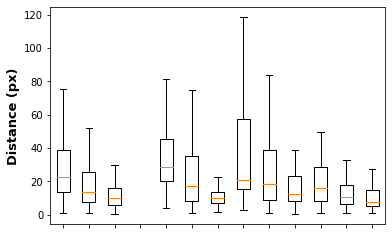

In [53]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots()

data = [models, models_kalman, humans, [], c_10_dist_2, models_kalman_2, distances_cam2_human, 
        c_10_dist_3, models_kalman_3, distances_cam3_human,
       c_10_dist_1, models_kalman_1, distances_cam1_human]

xtick = []
ax.boxplot(data, showfliers=False)
ax.set_xticklabels(xtick)
ax.set_ylabel("Distance (px)", fontweight ='bold', fontsize = 13)
plt.savefig('/Users/betinakreiman/Desktop/figs/fig5c.pdf', format='pdf')


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

data_1 = [models, [], c_10_dist_2, c_10_dist_3, c_10_dist_1]
data_2 = [models_kalman, models_kalman_2, models_kalman_3, models_kalman_1]
data_3 = [humans, distances_cam2_human, distances_cam3_human, distances_cam1_human]


c = "#e19136"
box = plt.boxplot(data_1, positions=[1,4,5,8,11], notch=False, patch_artist=True,
            boxprops=dict(facecolor=c, color="black"),
            medianprops=dict(color="w"),
            showfliers = False,
            )


# option 2, set all colors individually
c2 = "#7cb656"
box1 = plt.boxplot(data_2, positions=[2,6,9,12], notch=False, patch_artist=True, showfliers=False,
                  medianprops=dict(color="#df7a32"),
                   boxprops=dict(facecolor=c2, color="black"))
                  #widths = 0.3)
    
c3 = "#9d9fa2"
box2 = plt.boxplot(data_3, positions=[3,7,10,13], notch=False, patch_artist=True, showfliers=False,
                  medianprops=dict(color="#df7a32"),
                   boxprops=dict(facecolor=c3, color="black"))
                  #widths = 0.3)

#plt.xlim(0.5,4)
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12,13], ["","", None,"","", "", "", "", "", "", "", "", ""], ha="left")
plt.ylabel("Distance (px)", fontweight ='bold', fontsize = 13)
plt.ylim([-5, 133])
plt.xlabel(" ")

#plt.legend(["dModels", "dModels+Kalman", "dHumans"])
#plt.legend([box, box1, box2])
plt.savefig('/Users/betinakreiman/Desktop/figs/fig5c_bar.pdf', format='pdf')
#plt.xaxis.set_minor_locator(AutoMinorLocator())

#plt.tick_params(which="minor", color="r")
plt.show()


In [54]:
import numpy as np
from scipy.stats import ranksums

In [55]:
# Statistical Tests!

# left posterior (human-model vs. human-model(kalman10))
ranksums(c_10_dist_2, c_0_dist_2)

RanksumsResult(statistic=0.9018672040080422, pvalue=0.3671274148363307)

In [56]:
# right posterior (human-model vs. human-model(kalman10))
ranksums(c_10_dist_3, c_0_dist_3)

RanksumsResult(statistic=0.7754198434460899, pvalue=0.43809161331028146)

In [57]:
# posterior (human-model vs. human-model(kalman10))
ranksums(c_10_dist_1, c_0_dist_1)

RanksumsResult(statistic=-0.28450656126439267, pvalue=0.776022206544154)

In [58]:
# right posterior (3) for jaeson for left thigh (2)
dists_2_c0_jaeson_3 = particular_part(cross_b3_j, coeffs_jaeson_3[0], indeces_1, 2)
dists_2_c10_jaeson_3 = particular_part(cross_b3_j, coeffs_jaeson_3[1], indeces_1, 2)

ranksums(dists_2_c0_jaeson_3, dists_2_c10_jaeson_3)

RanksumsResult(statistic=1.1489125293076057, pvalue=0.25059205068568424)

In [59]:
# right posterior (3) for kreiman for left thigh (2)
dists_2_c0_kreiman_3 = particular_part(cross_b3_k, coeffs_kreiman_3[0], indeces_1, 2)
dists_2_c10_kreiman_3 = particular_part(cross_b3_k, coeffs_kreiman_3[1], indeces_1, 2)

ranksums(dists_2_c0_kreiman_3, dists_2_c10_kreiman_3)

RanksumsResult(statistic=-0.1044465935734187, pvalue=0.9168149485280885)

In [60]:
# posterior (1) for jaeson for left foot(0)
dists_0_c0_jaeson_1 = particular_part(cross_b1_j, coeffs_jaeson_1[0], indeces_1, 0)
dists_0_c10_jaeson_1 = particular_part(cross_b1_j, coeffs_jaeson_1[1], indeces_1, 0)

ranksums(dists_0_c0_jaeson_1, dists_0_c10_jaeson_1)

RanksumsResult(statistic=-1.1239977660353326, pvalue=0.2610139736612984)

In [61]:
compare_all_coef(cross_b3_j, coeffs_jaeson_3, 2)

Coefficient 0 ,  average: 127.44611717152989 ,  std: 13.826756274719793

Coefficient 10 ,  average: 114.56506498298026 ,  std: 25.187884540690227



In [62]:
# Comparing everything
c0 = c0_k_diff_1 + c0_k_diff_2 + c0_k_diff_3 + c0_j_diff_1 + c0_j_diff_2 + c0_j_diff_3
c10 = c10_k_diff_1 + c10_k_diff_2 + c10_k_diff_3 + c10_j_diff_1 + c10_j_diff_2 + c10_j_diff_3
ranksums(c0, c10)

RanksumsResult(statistic=-6.83500431676071, pvalue=8.200255949257249e-12)

In [63]:
# All:
# 	d_model vs. d_Kalman: p = 
ranksums(models, models_kalman)
# 	d_Kalman vs. d_human: p = 	
ranksums(models_kalman, humans)

# LP:
# 	d_model vs. d_Kalman: p = 
ranksums(c_10_dist_2, models_kalman_2)
# 	d_Kalman vs. d_human: p = 
ranksums(distances_cam2_human, models_kalman_2)

# RP:
# 	d_model vs. d_Kalman: p = 
ranksums(c_10_dist_3, models_kalman_3)
# 	d_Kalman vs. d_human: p = 
ranksums(distances_cam3_human, models_kalman_3)
	
# P:
# 	d_model vs. d_Kalman: p = 
ranksums(c_10_dist_1, models_kalman_1)
# 	d_Kalman vs. d_human: p = 
ranksums(distances_cam1_human, models_kalman_1)

RanksumsResult(statistic=-2.5064344946714763, pvalue=0.012195565286131657)

In [65]:
# Kalman vs. Model
print("all: ", ranksums(models, models_kalman))
print()
print("2: ", ranksums(c_10_dist_2, models_kalman_2))
print()
print("3: ", ranksums(c_10_dist_3, models_kalman_3))
print()
print("1: ", ranksums(c_10_dist_1, models_kalman_1))

all:  RanksumsResult(statistic=7.624609748663274, pvalue=2.4477374382243772e-14)

2:  RanksumsResult(statistic=5.271444510892472, pvalue=1.3535421120996502e-07)

3:  RanksumsResult(statistic=2.81500166631925, pvalue=0.004877698097817036)

1:  RanksumsResult(statistic=3.9419450190186076, pvalue=8.082350635618214e-05)


In [64]:
# Kalman vs. Human
print("all: ", ranksums(models_kalman, humans))
print()
print("2: ", ranksums(models_kalman_2, distances_cam2_human))
print()
print("3: ", ranksums(models_kalman_3, distances_cam3_human))
print()
print("1: ", ranksums(models_kalman_1, distances_cam1_human))

all:  RanksumsResult(statistic=5.411435573929882, pvalue=6.252148842397192e-08)

2:  RanksumsResult(statistic=4.952257688582168, pvalue=7.335737276134773e-07)

3:  RanksumsResult(statistic=2.568567062673049, pvalue=0.010211995058006199)

1:  RanksumsResult(statistic=2.5064344946714763, pvalue=0.012195565286131657)


## Images!
#### of left/right posterior veiws 

In [209]:
import matplotlib.pyplot as plt
import matplotlib.cbook as cbook
from matplotlib_scalebar.scalebar import ScaleBar

In [370]:
def show(c_0, c_10, part, frame, block):
    directory = '/Users/betinakreiman/Desktop/Life/research/comparing_csv_annotations/computer_labels_3cam/cam1AllFrames/frame'
    if block == 2:
        directory = '/Users/betinakreiman/Desktop/Life/research/comparing_csv_annotations/computer_labels_3cam/cam2/frame'
    elif block == 3:
        directory = '/Users/betinakreiman/Desktop/Life/research/comparing_csv_annotations/computer_labels_3cam/cam3/frame'
    
    directory += str(frame) + '.jpg'
    img = plt.imread(directory)
    
    x_0 = c_0[part][frame][0]
    y_0 = c_0[part][frame][2]
    
    x_10 = c_10[part][frame][0]
    y_10 = c_10[part][frame][2]
    
    plt.plot(x_0, y_0, color="yellow", marker='.', markersize=20, linestyle="None")
    plt.plot(x_10, y_10, color="blue", marker='.', markersize=20, linestyle="None")
    
    # adding human annotation
    #plt.plot(583, 219, color="lime", marker='.', markersize=20, linestyle="None")
    
    scalebar = ScaleBar(600/620, 'px', rotation="vertical", scale_loc="right", dimension="pixel-length", color="white", border_pad=0.6, box_alpha=0, width_fraction = 0.025) # 1 pixel = 0.2 meter
    plt.gca().add_artist(scalebar)
    
    plt.axis('off')
    plt.imshow(img)
    plt.xlim([350, 800])
    plt.ylim([550, 100])
    #plt.legend(["oc=0", "oc=10"])
    plt.legend(["oc=0", "oc=10", "human"], loc='lower right', facecolor="white", framealpha=0.9)
    plt.show()
    

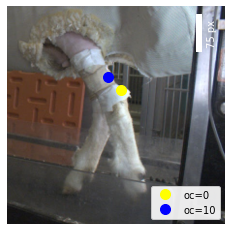

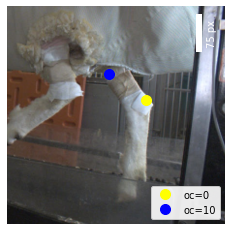

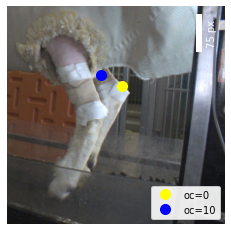

In [371]:
# showing jaeson cam2 img 5068
show(block2_jaeson_0, block2_jaeson_10, 5, 5068 - 24, 2)
show(block2_jaeson_0, block2_jaeson_10, 5, 5068, 2)
show(block2_jaeson_0, block2_jaeson_10, 5, 5068 + 24, 2)

1504


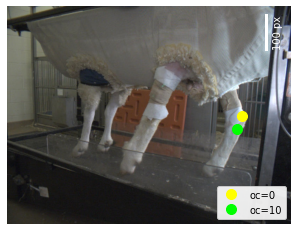


1513


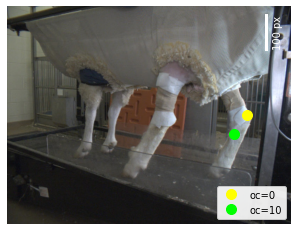


1584


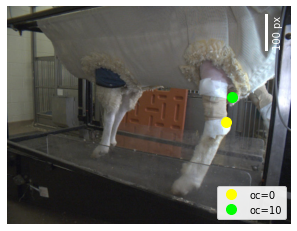


17


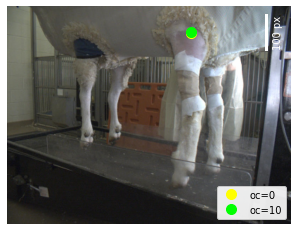


1806


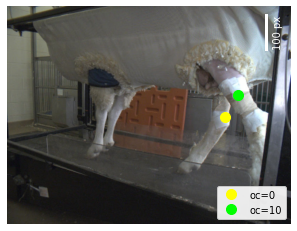


1867


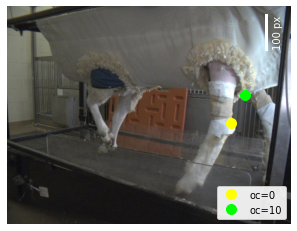


2424


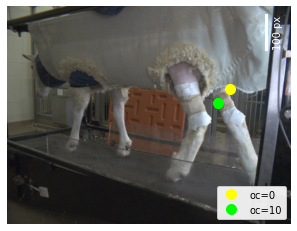


2807


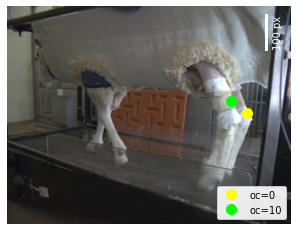


2897


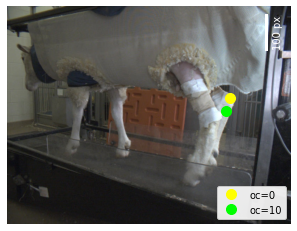


2903


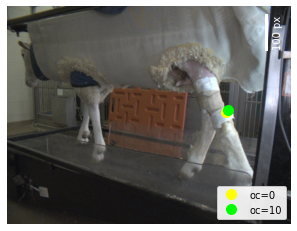


2927


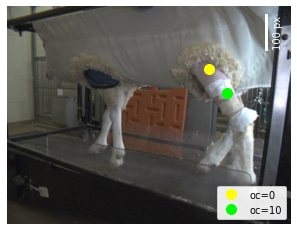


4376


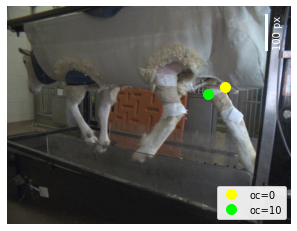


4763


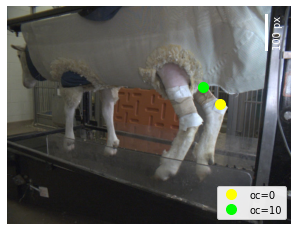


5068


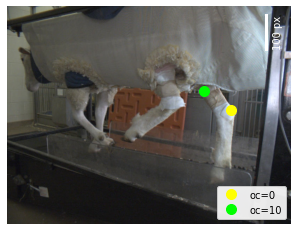


5199


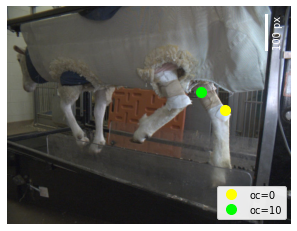


5409


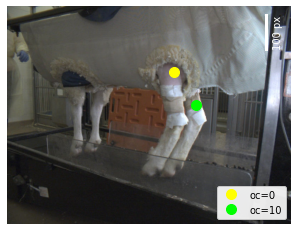


5684


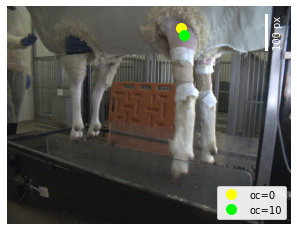


60


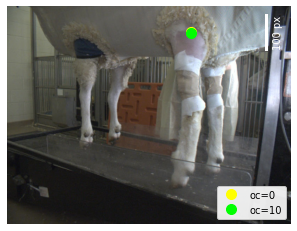


627


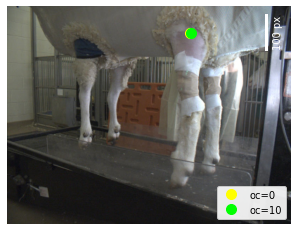


912


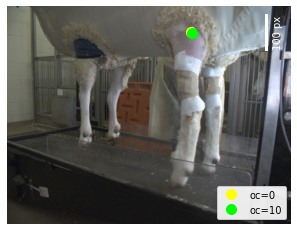

In [236]:
# for cam 2
for i in indeces_1:
    # jaeson
    #print("jaeson")
    print(i)
    show(block2_jaeson_0, block2_jaeson_10, 5, int(i), 2)
    

    # betina
    #print("betina")
    #show(block2_kreiman_0, block2_kreiman_10, 5, int(i), 2)

    #print()
    print()


In [237]:
# going to go through (manually) each annotaor and see if image shows good result
# add these frames to list, then go through list and show frame w/ annotations 1 sec before and after

frames_good_2_k = [4763, 5068]
frames_good_2_j = [1584, 1867, 2807, 4763, 5068, 5199]

In [242]:
# for cam 3
#for i in indeces_1:
    # jaeson
    #print("jaeson")
    #print(i)
    #show(block3_jaeson_0, block3_jaeson_10, 2, int(i), 3)
    

    # betina
    #print("betina")
    #show(block3_kreiman_0, block3_kreiman_10, 2, int(i), 3)

    #print()
    #print()


In [252]:
frames_good_3_k = [1584, 2807, 2903]
frames_good_3_j = [1513, 2424, 2897, 2903, 4376, 4763, ]

In [246]:
def show_gait(c0, c10, block, part, frames, gait):
    for i in range(len(frames)):
        print(frames[i])
        show(c0, c10, part, frames[i] - gait, block)
        show(c0, c10, part, frames[i], block)
        show(c0, c10, part, frames[i] + gait, block)
        
        print()


4763


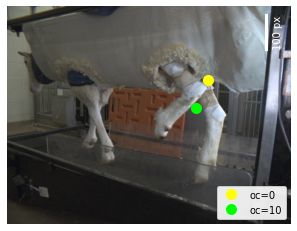

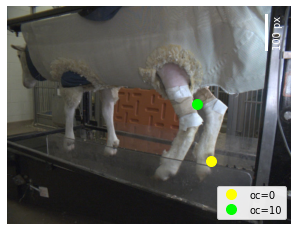

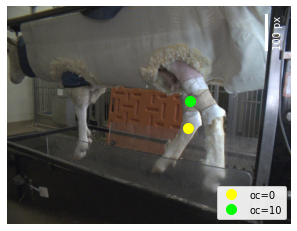


5068


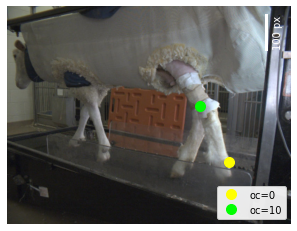

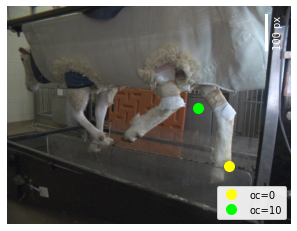

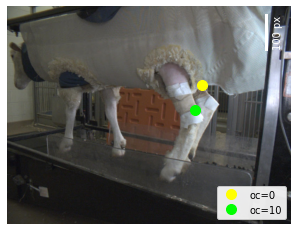

In [247]:
# kreiman block 2
show_gait(block2_kreiman_0, block2_kreiman_10, 2, 5, frames_good_2_k, 24)

1584


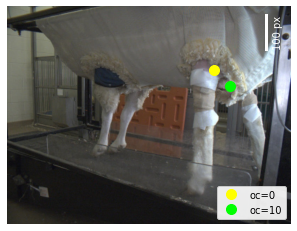

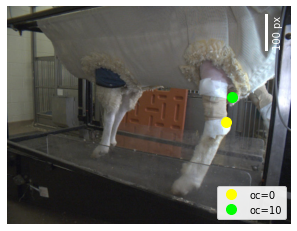

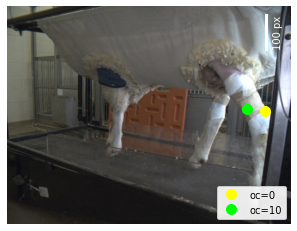


1867


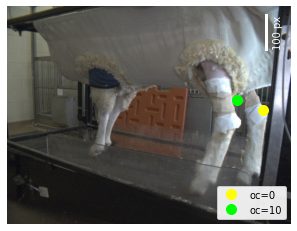

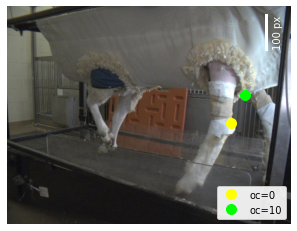

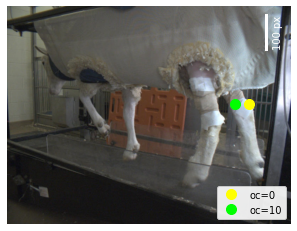


2807


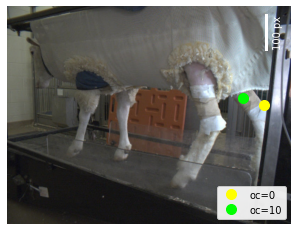

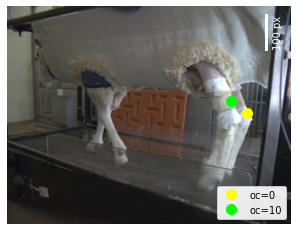

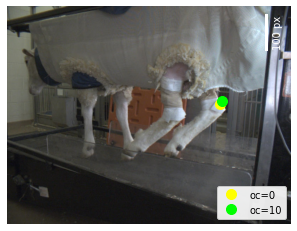


4763


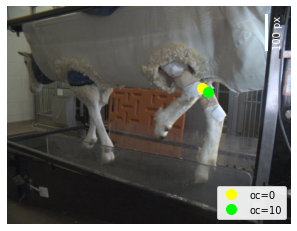

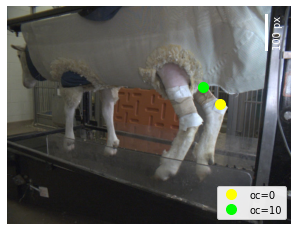

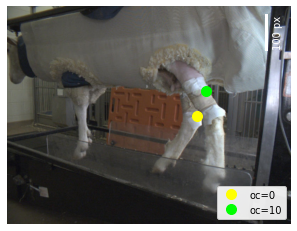


5068


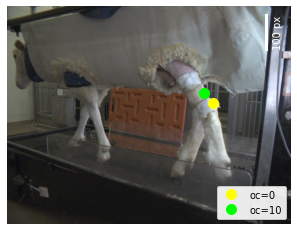

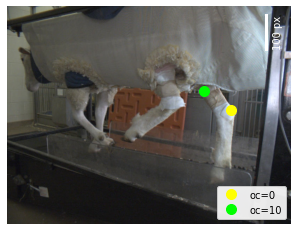

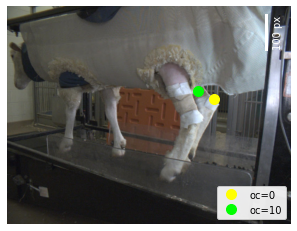


5199


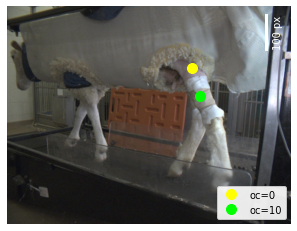

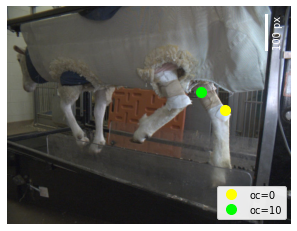

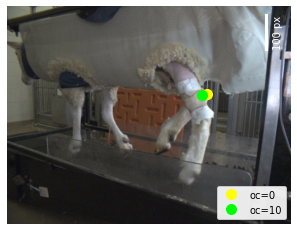

In [249]:
# jaeson block 2
show_gait(block2_jaeson_0, block2_jaeson_10, 2, 5, frames_good_2_j, 24)

1584


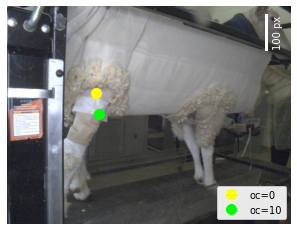

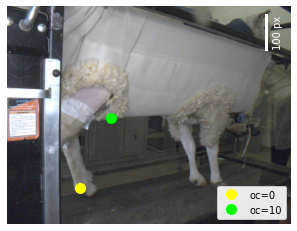

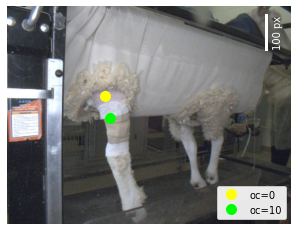


2807


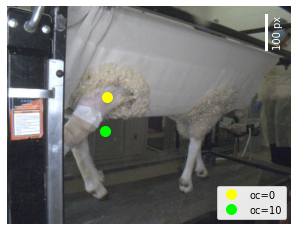

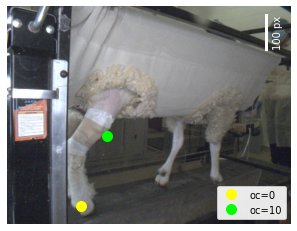

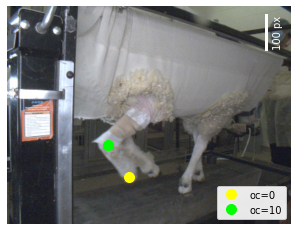


2903


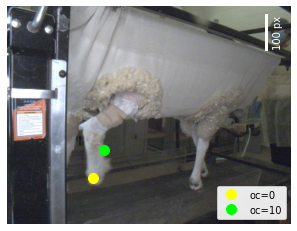

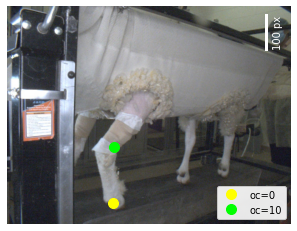

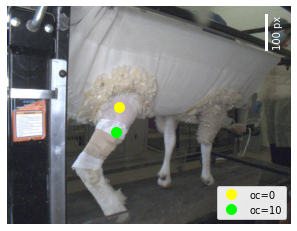

In [253]:
# kreiman block 3
show_gait(block3_kreiman_0, block3_kreiman_10, 3, 2, frames_good_3_k, 24)

1513


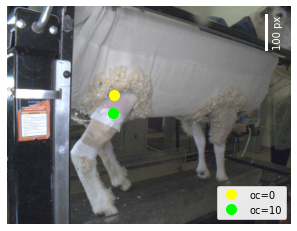

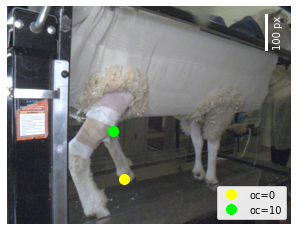

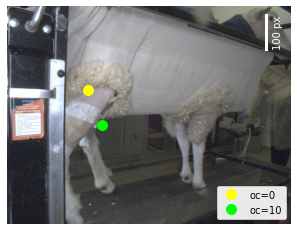


2424


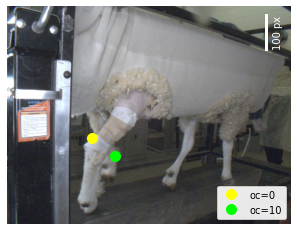

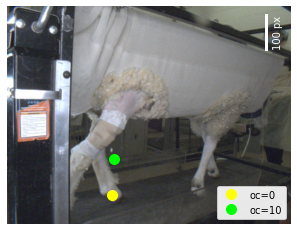

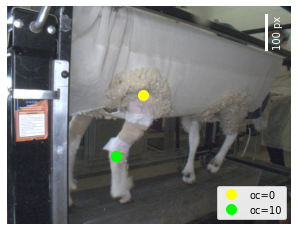


2897


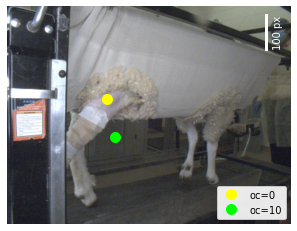

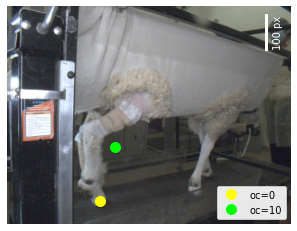

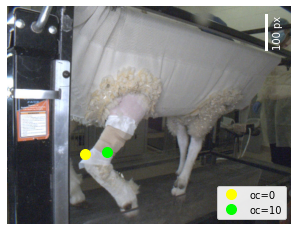


2903


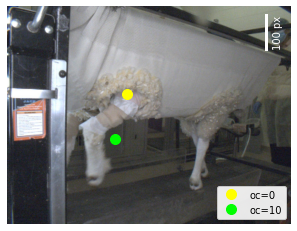

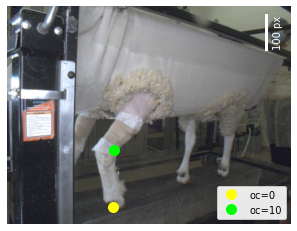

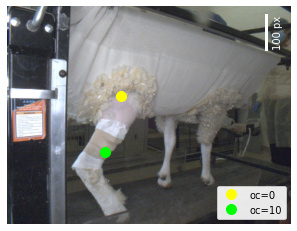


4376


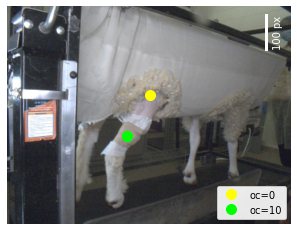

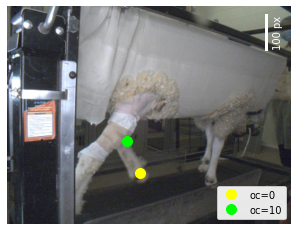

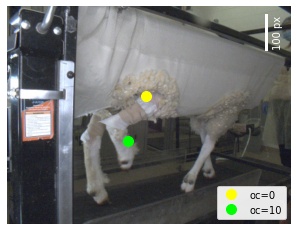


4763


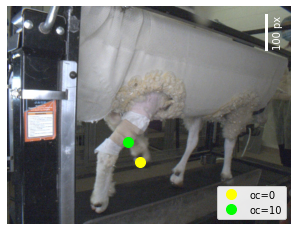

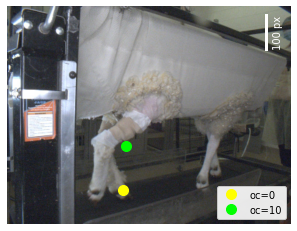

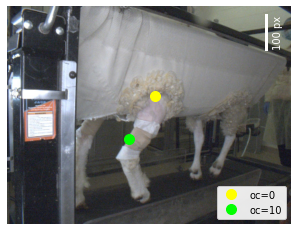

In [254]:
# jaeson block 3
show_gait(block3_jaeson_0, block3_jaeson_10, 3, 2, frames_good_3_j, 24)

## Creating Smooth Kalman Graphs

In [341]:
a = 0.6
def createGraphs_allCO(measured, smoothed_0, smoothed_10, xLim, humanX, humanY, frameNumber):   
    plt.figure(2)
    color_1 = "#64C8FA"
    times = range(measured.shape[0])
    plt.plot(times, measured[:, 0], color=color_1, marker='o', alpha=a) # x coor original
    plt.plot(times, measured[:, 1], color="red", marker='o', alpha=a) # y coor original
             
    plt.plot(times, smoothed_0[:, 0], '--', alpha=a, color=color_1) # x coor original line dash
    plt.plot(times, smoothed_10[:, 0], 'k--', alpha=1) # x coor oc=10 line dash
             
    plt.plot(times, smoothed_0[:, 2], '--', alpha=a, color="red") # y coor original line dash
    plt.plot(times, smoothed_10[:, 2],'k--', alpha=1) # y coor oc=10 line dash
    
    plt.plot(4, 3, marker="o", markersize=20, markeredgecolor="red", markerfacecolor="green")
    plt.plot(frameNumber, humanX, marker="o", markersize=15, markeredgecolor="black", markerfacecolor="none")
    plt.plot(frameNumber, humanY, marker="o", markersize=15, markeredgecolor="black", markerfacecolor="none")
    plt.xlim(xLim)
    plt.ylim([250, 500])
    plt.xlabel('Frames', fontweight ='bold', fontsize = 13)
    plt.ylabel('Coordinates', fontweight ='bold', fontsize = 13)
    #plt.title(title, fontweight ='bold', fontsize = 14)
    plt.savefig('/Users/betinakreiman/Desktop/figs/fig5b.pdf', format='pdf')
    plt.show()

    

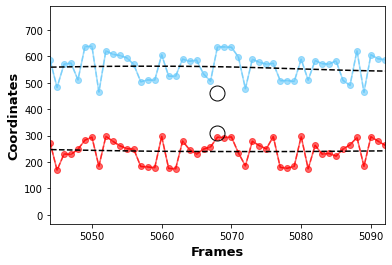

In [335]:
# x_5068 = float(x_b2_j[5][13])
# y_5068 = float(y_b2_j[5][13])
x_5068 = 583
y_5068 = 219
createGraphs_allCO(arrs[2][5], blocks_0[2][5], blocks_10[2][5], frames_1[13], x_5199, y_5199, int(indeces_1[13]))


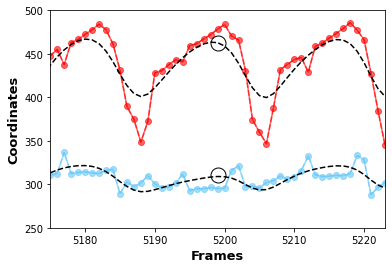

In [342]:
x_5199 = float(x_b1_j[3][14])
y_5199 = float(y_b1_j[3][14])
createGraphs_allCO(arrs[0][3], blocks_0[0][3], blocks_10[0][3], frames_1[14], x_5199, y_5199, int(indeces_1[14]))

In [299]:
indeces_1[13]

'5068'

In [ ]:
#blocks_0 = [block1_jaeson_0, block1_kreiman_0, block2_jaeson_0,
           #block2_kreiman_0, block3_jaeson_0, block3_kreiman_0]
#blocks_10 = [block1_jaeson_10, block1_kreiman_10, block2_jaeson_10,
           #block2_kreiman_10, block3_jaeson_10, block3_kreiman_10]
#arrs = [arr_block1_jaeson, arr_block1_kreiman, arr_block2_jaeson,
       #arr_block2_kreiman, arr_block3_jaeson, arr_block3_kreiman]
